# Analyzing images of singledoubletriple vertical lines

## Initialization

In [1]:
%load_ext autoreload
%autoreload 2
LOGGERDEFINED = False

In [2]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
module_path = os.path.abspath(os.path.join('..'))
sys.path.append(module_path)
sys.path.append(os.path.dirname(module_path))
from py.tools.config import cfg
import py.tools.logs as logs
import py.vid.v_tools as vt
import py.metrics.m_SDT as me
from py.im.imshow import imshow
import py.file.file_handling as fh
import pandas as pd
LOGGERDEFINED = logs.openLog('still_measure.ipynb', LOGGERDEFINED, level='DEBUG', exportLog=False)

# export crops

In [566]:
# export cropped images and table of their crop locations
folder = os.path.join(cfg.path.server, 'SDT\SO_S20-0.5')
exp = me.cropExporter(folder, me.fileVertSDT, mustMatch=['Vert'], overwrite=True)
exp.run()

INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\singleDoubleTriple\SO_S20-0.5\I_SO6-S20-0.5_S_4.00\I_SO6-S20-0.5_S_4.00_230215\disturbVert2_3_1.250\disturbVert2_3_1.250_cropLocs_I_SO6-S20-0.5_S_4.00_230215_190158_2.csv


[]

# generate Usegment

In [36]:
# export just the segmented images
# folder = [os.path.join(cfg.path.server, 'SDT', s) for s in ['SO_S20-0.5', 'SO_S85-0.05']]
folder = os.path.join(cfg.path.server, r'SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_2_0.875')
vexp = me.segmentExporter(folder, me.fileVertSDT, mustMatch=['Vert'], overwrite=False)
verrorList = vexp.run()

In [9]:
vexp.folderErrorList

[]

# move crops to ML folder

In [ ]:
# find folders which are missing ML results and copy the files to the transfer folder
cropfolder = os.path.join(cfg.path.server, 'singleDoubleTripleML', 'newCrops')
topfolder = os.path.join(cfg.path.server, 'SDT')
missingFolders = me.findMissingML(topfolder, cropfolder, mustMatch=['Vert'])

In [5]:
# split newcrops into sub folders
folder = os.path.join(cfg.path.server, 'singleDoubleTripleML', 'newCrops')
me.splitIntoSubFolders(folder)

# move ML results back to folders

In [6]:
# move ML segmented images from the output folder to the appropriate subfolders
folders = [os.path.join(cfg.path.server
                       , r'singleDoubleTripleML\results'
                       , f'lf-unet-vert-SO-{s}-segment-outputDir'
                       , 'png') for s in [10]]
rm = me.resultMover(folders,os.path.join(cfg.path.server, 'SDT'))

INFO: Copying 9975 files in ['//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\\singleDoubleTripleML\\results\\lf-unet-vert-SO-10-segment-outputDir\\png']
INFO: Copied 1, already 0, total 9975
INFO: Copied 101, already 0, total 9975
INFO: Copied 201, already 0, total 9975
INFO: Copied 301, already 0, total 9975
INFO: Copied 401, already 0, total 9975
INFO: Copied 501, already 0, total 9975
INFO: Copied 601, already 0, total 9975
INFO: Copied 701, already 0, total 9975
INFO: Copied 801, already 0, total 9975
INFO: Copied 901, already 0, total 9975
INFO: Copied 1001, already 0, total 9975
INFO: Copied 1101, already 0, total 9975
INFO: Copied 1201, already 0, total 9975
INFO: Copied 1301, already 0, total 9975
INFO: Copied 1401, already 0, total 9975
INFO: Copied 1501, already 0, total 9975
INFO: Copied 1601, already 0, total 9975
INFO: Copied 1701, already 0, total 9975
INFO: Copied 1801, already 0, total 9975
INFO: Copied 1901, already 0, total 9975
INFO: Copied 2001, alread

In [111]:
rm.moveMLResult(rm.error[2])

FileNotFoundError: Could not find disturbHoriz3_1_0.500_vstill_HOh1_l1d1o5_I_SO7-S20-0.5_S_3.00_230509_112005_1.png in //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT

# make measurements and summaries and summary table

In [7]:
# fstr = r'SDT'
# folder = os.path.join(cfg.path.server, fstr)
folder = os.path.join(cfg.path.server, r'SDT')
sv = me.summarizerVertSDT(folder, overwriteMeasure=True, overwriteSummary=True)

In [ ]:
sv.run()
sv.export()

INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\disturbVert2_1_0.500_failures_I_SO10_S_3.00_230208_100619_3.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\disturbVert2_1_0.500_measure_I_SO10_S_3.00_230208_100619_3.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.500\disturbVert2_1_0.500_summary_I_SO10_S_3.00_230208_100619_3.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.625\disturbVert2_1_0.625_failures_I_SO10_S_3.00_230208_100741_3.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO\I_SO10_S_3.00\I_SO10_S_3.00_230208\disturbVert2_1_0.625\disturbVert2_1_0.625_measure_I_SO10_S_3.00_230208_1

In [28]:
fh.openExplorer(sv.folderErrorList[0]['folder'])

In [30]:
sv.folderErrorList

[{'folder': '//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\\SDT\\SO_S85-0.05\\I_SO9-S85-0.05_S_3.00\\I_SO9-S85-0.05_S_3.00_230512\\disturbVert2_2_1.000',
  'error': ValueError("could not convert string to float: ''")}]

In [29]:
sv.testFolderError(1)

IndexError: list index out of range

# evaluate errors

## initialize the test object

In [91]:
ft = me.failureTest(os.path.join(cfg.path.fig, 'SDT', 'summaries', 'VertSDTFailures.csv'), me.fileVertSDT)

882 failed files, 205 failed folders


## iterate through folders to check measurements and approve if correct or redoing

1. if correct, approve folder
2. if needs to be redone, approve the folder, then measureSummarize
3. if pictures need to be redone, export stills, then testFolder again, then go back to step 1

In [519]:
fostr = ft.firstBadFolder()
ft.testFolder(fostr, diag=1)

In [517]:
ft.approveFolder(fostr, whiteOut=True)

INFO: Whited out \SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_3_1.250\disturbVert2_3_1.250_vstill_V3_l0w1p1_I_SO9-S85-0.05_S_4.00_230512_155925_8.png
INFO: Whited out \SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_3_1.250\crop\disturbVert2_3_1.250_vcrop_V3_l0w1p1_I_SO9-S85-0.05_S_4.00_230512_155925_8.png
INFO: Blacked out \SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_3_1.250\Usegment\disturbVert2_3_1.250_Usegment_V3_l0w1p1_I_SO9-S85-0.05_S_4.00_230512_155925_8.png
INFO: Blacked out \SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_3_1.250\MLsegment\disturbVert2_3_1.250_MLsegment_V3_l0w1p1_I_SO9-S85-0.05_S_4.00_230512_155925_8.png
INFO: Whited out \SDT\SO_S85-0.05\I_SO9-S85-0.05_S_4.00\I_SO9-S85-0.05_S_4.00_230512\disturbVert2_3_1.250\disturbVert2_3_1.250_vstill_V3_l1w1p1_I_SO9-S85-0.05_S_4.00_230512_155925_8.png
INFO: Whited out \SDT\SO_S85-0.05\I_SO9-

In [487]:
ft.approveFolder(fostr, whiteOut=False)

62 failed files, 15 failed folders


save progress

In [518]:
ft.export()

INFO: Exported C:/Users/lmf1/OneDriveNIST/NIST/data/shopbot/results\SDT\summaries\VertSDTFailures.csv


## make corrections to folders

In [214]:
folder = os.path.join(cfg.path.server, fostr)
fh.openExplorer(folder)

In [607]:
ft.openFolderInPaint(fostr)

## redo measurements

INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO_S85-0.05\I_SO8-S85-0.05_S_4.00\I_SO8-S85-0.05_S_4.00_230511\disturbXS2_3_+z_0.625\disturbXS2_3_+z_0.625_nozDims_I_SO8-S85-0.05_S_4.00_230511_114608_1.csv


{'xL': 343, 'xR': 403, 'yB': 310}

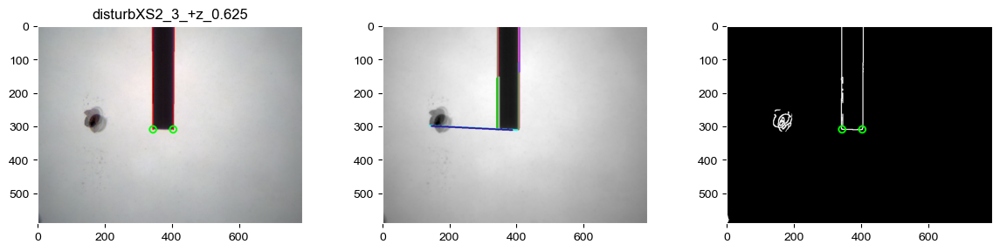

In [813]:
folder = os.path.join(cfg.path.server, fostr)
nv = nt.nozData(folder)
nv.detectNozzle(diag=2, overwrite=True, export=True)
nv.nozDims()

C:\Users\lmf1\Documents\GitHub\embedded3DPvids\py\im\imshow.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axarr = plt.subplots(rows, cols, figsize=(w,h))


INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO_S85-0.05\I_SO8-S85-0.05_S_4.00\I_SO8-S85-0.05_S_4.00_230511\disturbXS2_3_+z_0.625\disturbXS2_3_+z_0.625_failures_I_SO8-S85-0.05_S_4.00_230511_114608_1.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO_S85-0.05\I_SO8-S85-0.05_S_4.00\I_SO8-S85-0.05_S_4.00_230511\disturbXS2_3_+z_0.625\disturbXS2_3_+z_0.625_measure_I_SO8-S85-0.05_S_4.00_230511_114608_1.csv
INFO: Exported //cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO_S85-0.05\I_SO8-S85-0.05_S_4.00\I_SO8-S85-0.05_S_4.00_230511\disturbXS2_3_+z_0.625\disturbXS2_3_+z_0.625_summary_I_SO8-S85-0.05_S_4.00_230511_114608_1.csv
//cfs2e.nist.gov/642/internal/3D Printing Lab/Shopbot/videos\SDT\SO_S85-0.05\I_SO8-S85-0.05_S_4.00\I_SO8-S85-0.05_S_4.00_230511\disturbXS2_3_+z_0.625


,value,SE,N,units
yBot_w1p,-0.1074,0.0210,4.0,dEst
xLeft_w1p,-0.1191,0.0138,4.0,dEst
segments_w1o,1.0000,0.0000,8.0,
aspect_w1o,1.0891,0.0405,8.0,h/w
xshift_w1o,-0.0362,0.0045,8.0,w
yshift_w1o,-0.0239,0.0030,8.0,h
area_w1o,2.6894,0.3678,8.0,intended
xLeft_w1o,-0.1818,0.0207,8.0,dEst
yTop_w1o,1.0884,0.0880,8.0,dEst
xRight_w1o,0.2315,0.0890,8.0,dEst


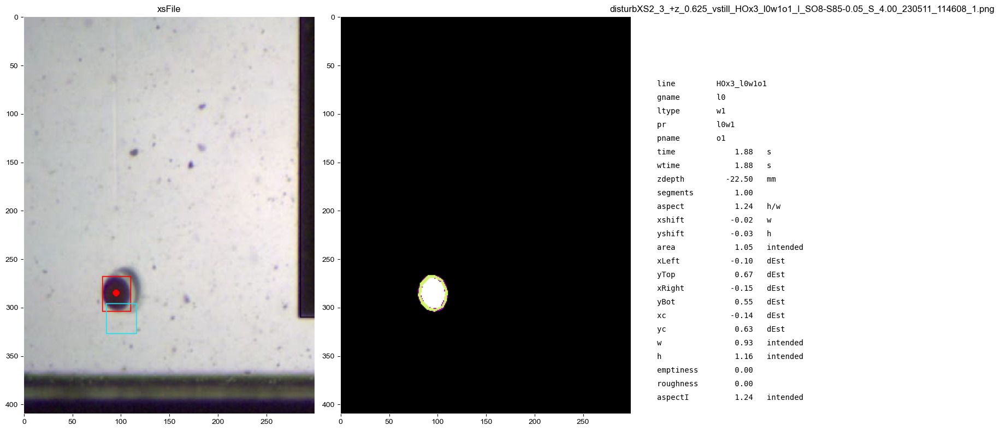

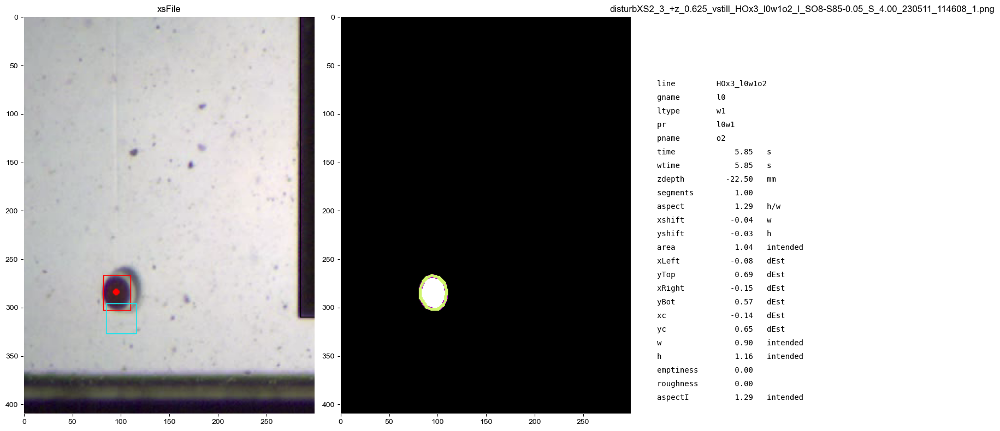

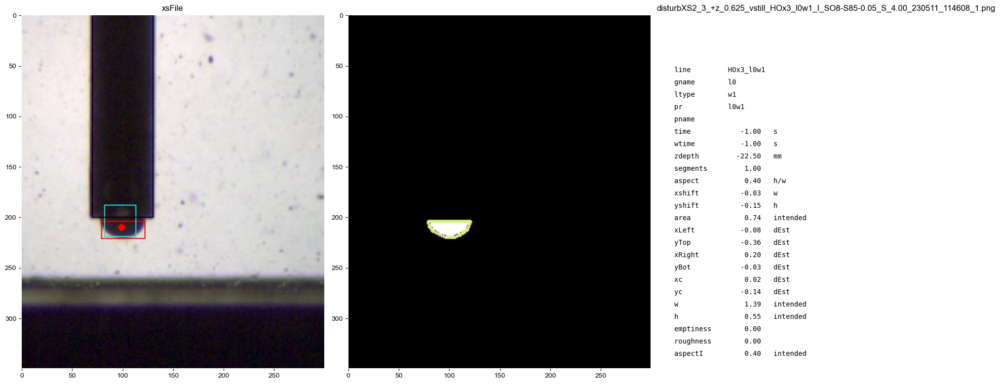

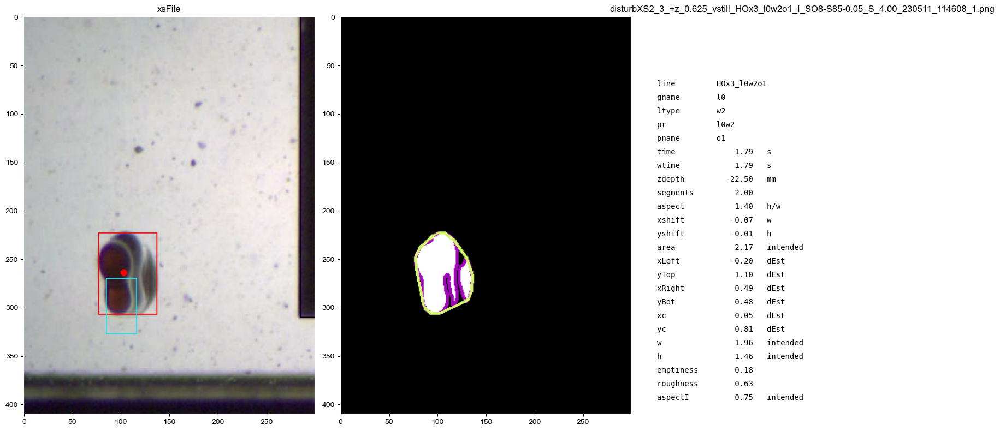

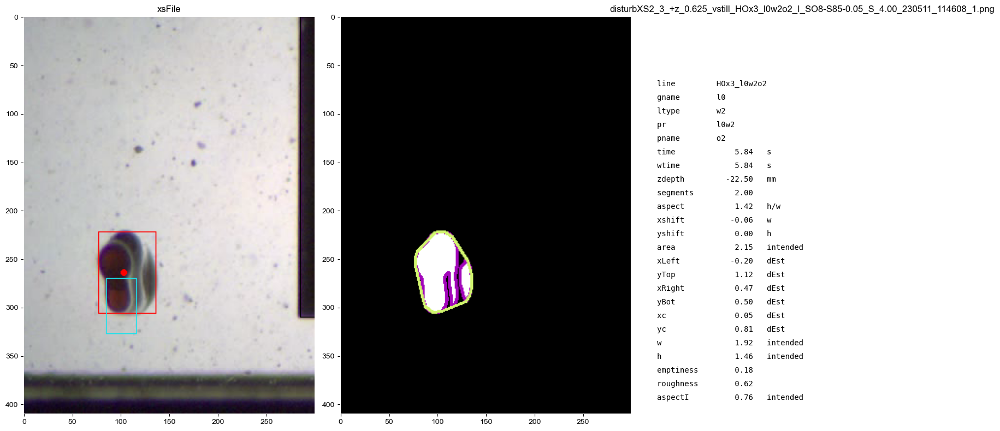

...

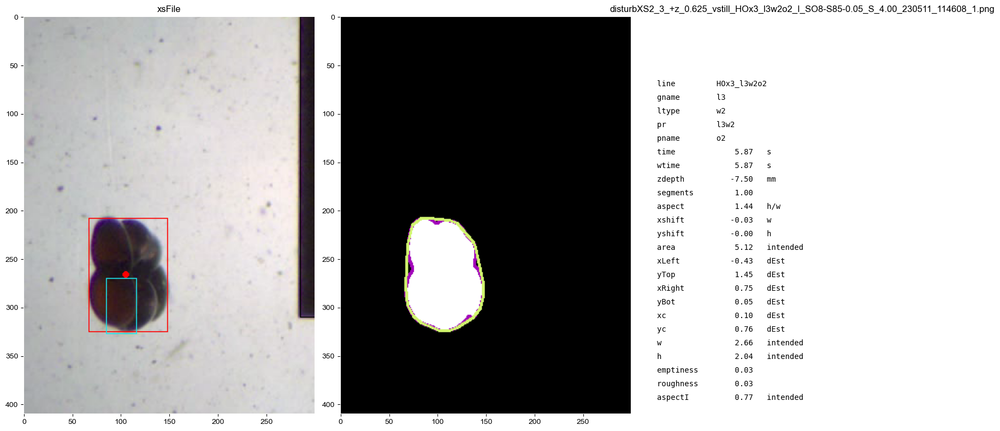

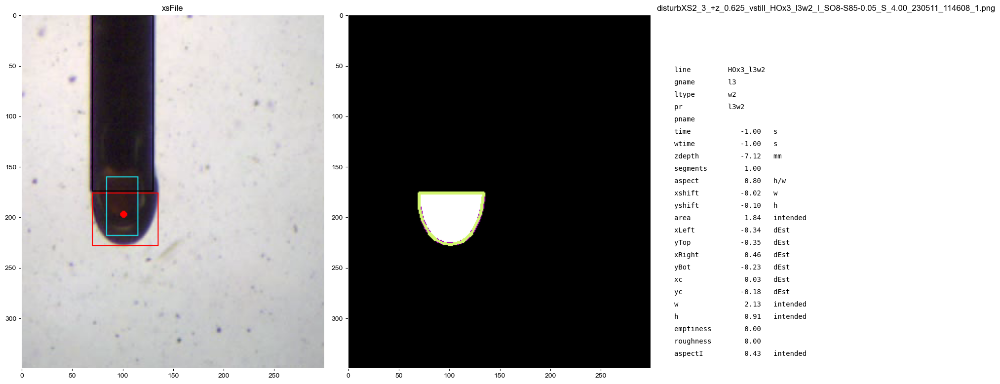

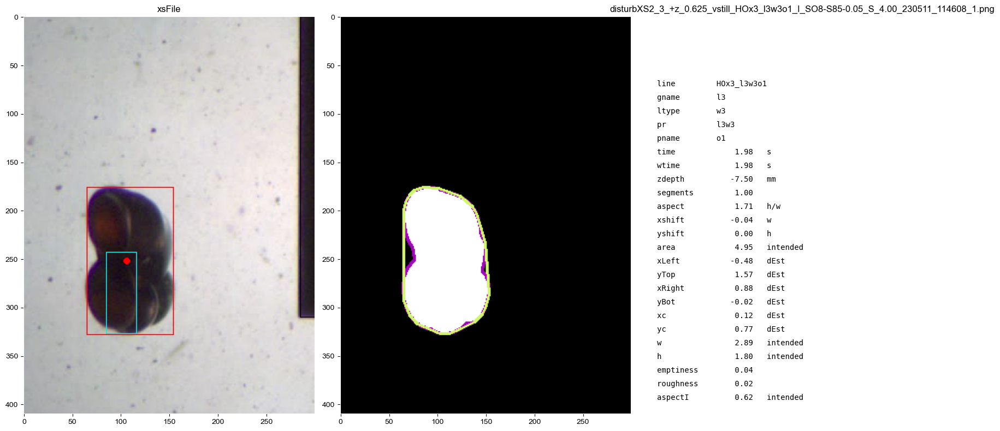

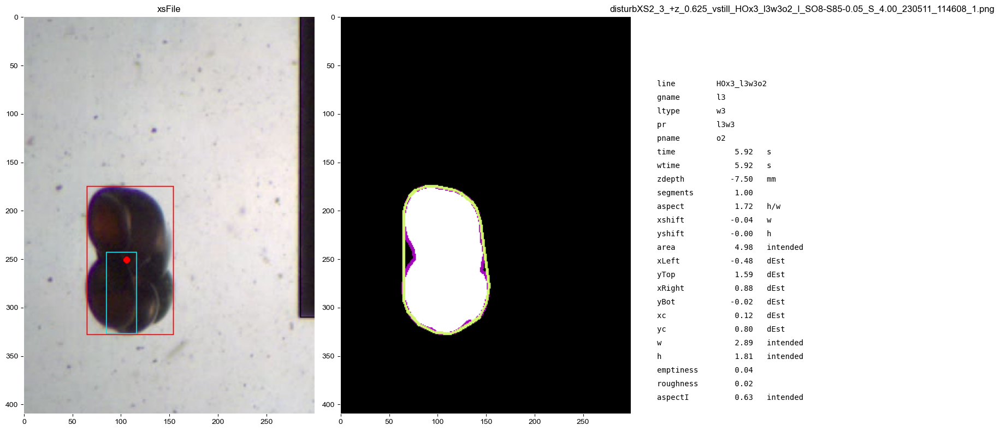

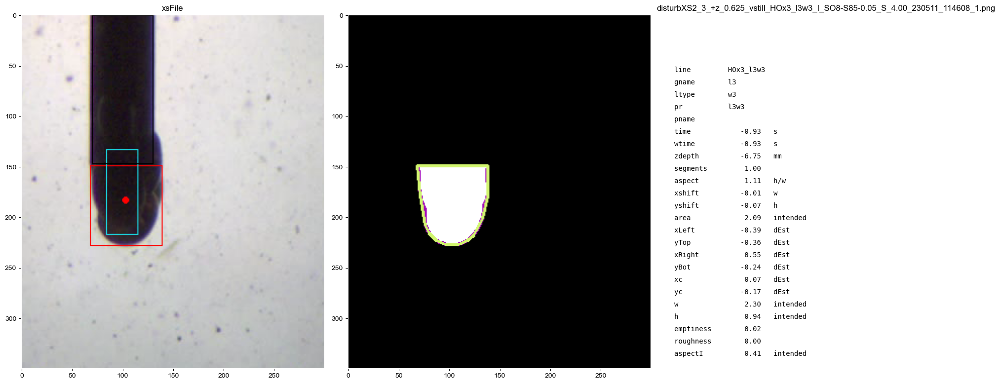

In [814]:
# ft.approveFolder(fostr)
# fostr = r'SDT\SO_S85-0.05\I_SO10-S85-0.05_S_3.00\I_SO10-S85-0.05_S_3.00_230516\disturbXS2_2_+z_1.000'
# folder = os.path.join(cfg.path.server, fostr)
folder = os.path.join(cfg.path.server, fostr)
fvs = me.folderVertSDT(folder, overwriteMeasure=True, overwriteSummary=True, diag=2)
fvs.measureFolder();
fvs.summarize();